In [1]:
# Import the libraries
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
from scipy import stats
%matplotlib inline
df=pd.DataFrame()

In [122]:
#Import data
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

In [123]:
print(df_train.shape,df_test.shape)

(1460, 81) (1459, 80)


In [124]:
print(df_train.dtypes.value_counts(),df_test.dtypes.value_counts())

object     43
int64      35
float64     3
Name: count, dtype: int64 object     43
int64      26
float64    11
Name: count, dtype: int64


In [90]:
df_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [140]:
#check missing data 
missing_data = []
for col in df_train.columns:
    missing_data.append([col, df_train[col].dtype,
                 df_train[col].nunique(),
                 df_train[col].isnull().sum(),
                 df_train[col].isnull().sum() / len(df_train) * 100])
    
missing_data = pd.DataFrame(missing_data, columns=['Column', 'dtype', 'Nunique', 'Missing_Values', 'Percentage'])
missing_data = missing_data.sort_values(by='Percentage', ascending=False)
missing_data = missing_data[missing_data.Percentage > 0]
missing_data

,Column,dtype,Nunique,Missing_Values,Percentage
72,PoolQC,object,3,1453,99.520548
74,MiscFeature,object,4,1406,96.301370
6,Alley,object,2,1369,93.767123
73,Fence,object,4,1179,80.753425
25,MasVnrType,object,3,872,59.726027
57,FireplaceQu,object,5,690,47.260274
3,LotFrontage,float64,110,259,17.739726
59,GarageYrBlt,float64,97,81,5.547945
64,GarageCond,object,5,81,5.547945
58,GarageType,object,6,81,5.547945


In [143]:
# Try fitting the data to several common distributions
distributions = ['norm', 'expon', 'lognorm', 'gamma', 'beta']
data =np.array(df_train['SalePrice'])
# Store the results
fit_results = []
fit_params = {}
# Fit our data set against each distribution
for distribution in distributions:
    # Get the distribution's function
    dist = getattr(stats, distribution)
    # Fit data to distribution
    param = dist.fit(data)
    # Get the Kolmogorov-Smirnov statistic
    ks_statistic, ks_p_value = stats.kstest(data, distribution, args=param)
    # Store the results
    fit_results.append([distribution, ks_statistic,ks_p_value])
    fit_params[distribution] = {'params': param, 'ks_statistic': ks_statistic, 'ks_p_value': ks_p_value}
# Sort the results by the Kolmogorov-Smirnov statistic
fit_results = pd.DataFrame(fit_results,columns=['Distribution','ks_statistic', 'ks_p_value']).sort_values(by='ks_statistic', ascending=True)
fit_results

C:\ProgramData\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:709: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\ProgramData\anaconda3\Lib\site-packages\scipy\optimize\_minpack_py.py:178: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  warnings.warn(msg, RuntimeWarning)


,Distribution,ks_statistic,ks_p_value
2,lognorm,0.040920,1.463130e-02
4,beta,0.066623,4.448639e-06
0,norm,0.123670,6.402140e-20
1,expon,0.289738,4.933205e-109
3,gamma,0.511734,0.000000e+00


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


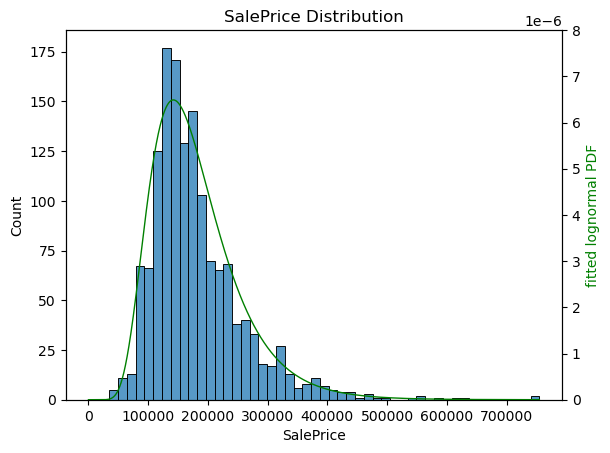

In [145]:
fig, ax1 = plt.subplots()# checking the distribution of the target variable
sns.histplot(df_train['SalePrice'])
plt.title('SalePrice Distribution')
shape, loc, scale = stats.lognorm.fit(np.array(df_train['SalePrice']))
x=np.linspace(0,max(df_train['SalePrice']),100000)
pdf = stats.lognorm.pdf(x, shape, loc, scale)
ax2 = ax1.twinx()
ax2.plot(x, pdf, 'g-', linewidth=1)
ax2.set_ylabel('fitted lognormal PDF', color='g')
ax2.set_ylim(0, 8e-6)
plt.show()

In [102]:
df_train['Log_SalePrice']=np.log(df_train['SalePrice'])

In [ ]:
num_col = df_train.select_dtypes(include=['int64', 'float64'])

In [103]:
df_train = df_train.drop(df_train[(df_train['GrLivArea']>5000)
                                  | (df_train['LotFrontage']>300)
                                  | (df_train['LotArea']>150000)].index)
df_train.shape

(1455, 82)

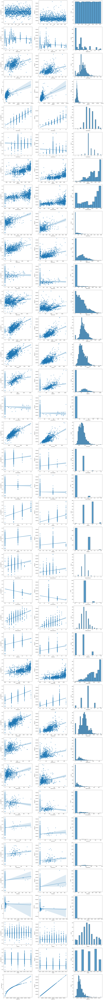

In [104]:
#numerical feature
plt.figure(figsize=(20, num_col.shape[1]*5))
for i, col in enumerate(num_col.columns):
    plt.subplot(num_col.shape[1], 3, 3*i+1)
    sns.regplot(data=df_train, x=col, y='Log_SalePrice')
    plt.subplot(num_col.shape[1], 3, 3*i+2)
    sns.regplot(data=df_train, x=col, y='SalePrice')
    plt.subplot(num_col.shape[1], 3, 3*i+3)
    sns.histplot(df_train[col])
plt.tight_layout()
plt.show()

<Axes: >

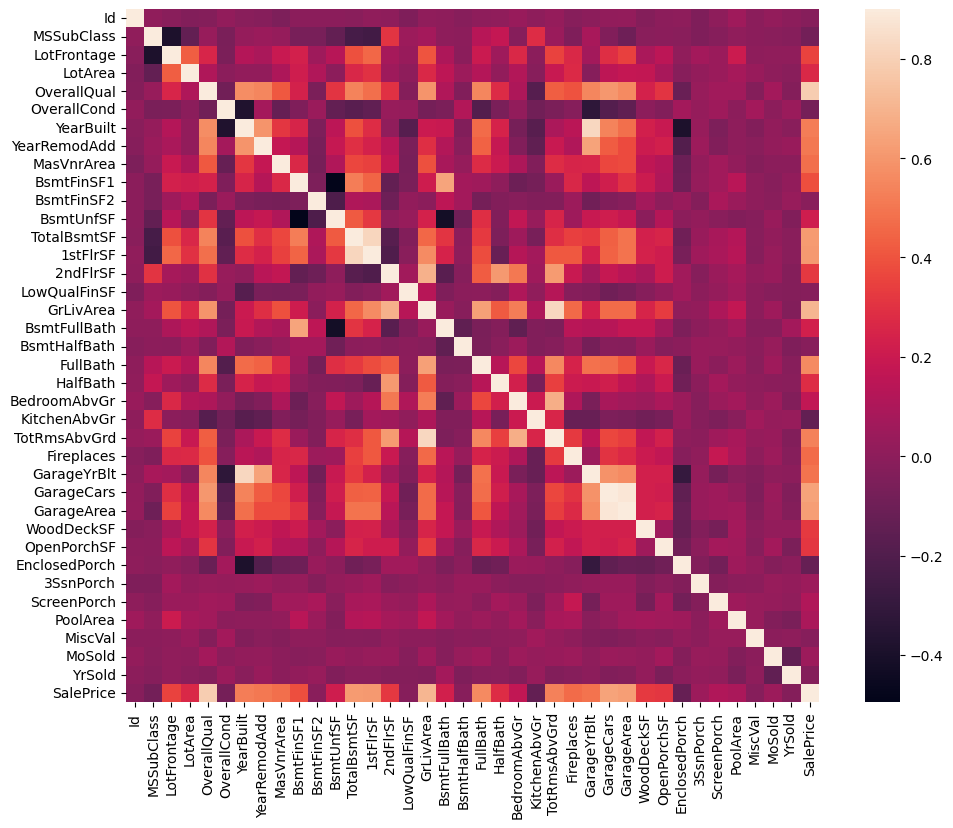

In [75]:
#Correlation map to see how features are correlated with SalePrice
corrmat = num_col.corr()
plt.subplots(figsize=(12,9))
sns.heatmap(corrmat, vmax=0.9, square=True)

In [107]:
cat_col = df_train.select_dtypes(include=['object']).fillna('NAN')

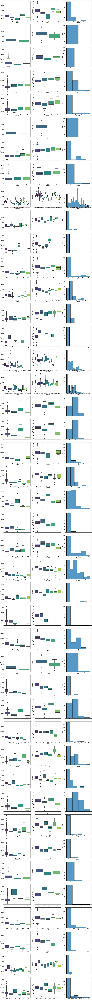

In [82]:
#categorical feature
plt.figure(figsize=(20, cat_col.shape[1]*5))
for i, col in enumerate(cat_col.columns):
    plt.subplot(cat_col.shape[1], 3, 3*i+1)
    sns.boxplot(data=df_train.fillna('NAN'), x=col, y='SalePrice', palette='viridis')
    plt.subplot(cat_col.shape[1], 3, 3*i+2)
    sns.boxplot(data=df_train.fillna('NAN'), x=col, y='Log_SalePrice', palette='viridis')
    plt.subplot(cat_col.shape[1], 3, 3*i+3)
    sns.histplot(df_train[col].fillna('NAN'))
plt.tight_layout()
plt.show()
#categorical boxplot suggest 
# logarithm of SalePrice helps remove the skewness
# no need to fill missing value given one-hot encoding 

In [116]:
corrmat['LotFrontage'].sort_values()

MSSubClass      -0.386347
OverallCond     -0.059213
Id              -0.010601
BsmtHalfBath    -0.007234
KitchenAbvGr    -0.006069
MiscVal          0.003368
YrSold           0.007450
EnclosedPorch    0.010700
MoSold           0.011200
LowQualFinSF     0.038469
ScreenPorch      0.041383
BsmtFinSF2       0.049900
HalfBath         0.053532
3SsnPorch        0.070029
GarageYrBlt      0.070250
2ndFlrSF         0.080177
WoodDeckSF       0.088521
YearRemodAdd     0.088866
BsmtFullBath     0.100949
YearBuilt        0.123349
BsmtUnfSF        0.132644
OpenPorchSF      0.151972
MasVnrArea       0.193458
FullBath         0.198769
PoolArea         0.206167
BsmtFinSF1       0.233633
OverallQual      0.251646
BedroomAbvGr     0.263170
Fireplaces       0.266639
GarageCars       0.285691
GarageArea       0.344997
SalePrice        0.351799
TotRmsAbvGrd     0.352096
TotalBsmtSF      0.392075
GrLivArea        0.402797
LotArea          0.426095
1stFlrSF         0.457181
LotFrontage      1.000000
Name: LotFro

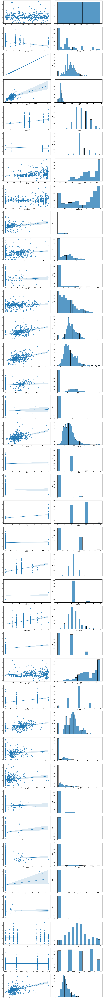

In [105]:
# how to fill missing value for LotFrontage
#numerical feature
plt.figure(figsize=(20, num_col.shape[1]*5))
for i, col in enumerate(num_col.columns):
    plt.subplot(num_col.shape[1], 2, 2*i+1)
    sns.regplot(data=df_train, x=col, y='LotFrontage')
    plt.subplot(num_col.shape[1], 2, 2*i+2)
    sns.histplot(df_train[col])
plt.tight_layout()
plt.show()

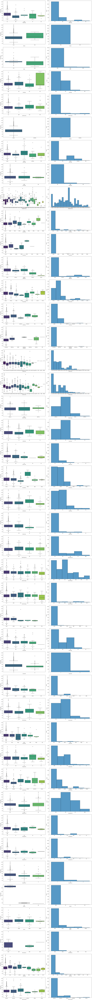

In [112]:
#categorical feature
plt.figure(figsize=(20, cat_col.shape[1]*5))
for i, col in enumerate(cat_col.columns):
    plt.subplot(cat_col.shape[1], 2, 2*i+1)
    sns.boxplot(data=df_train, x=col, y='LotFrontage', palette='viridis')
    plt.subplot(cat_col.shape[1], 2, 2*i+2)
    sns.histplot(df_train[col].fillna('NAN'))
plt.tight_layout()
plt.show()
#categorical boxplot suggest 
# logarithm of SalePrice helps remove the skewness
# no need to fill missing value given one-hot encoding 

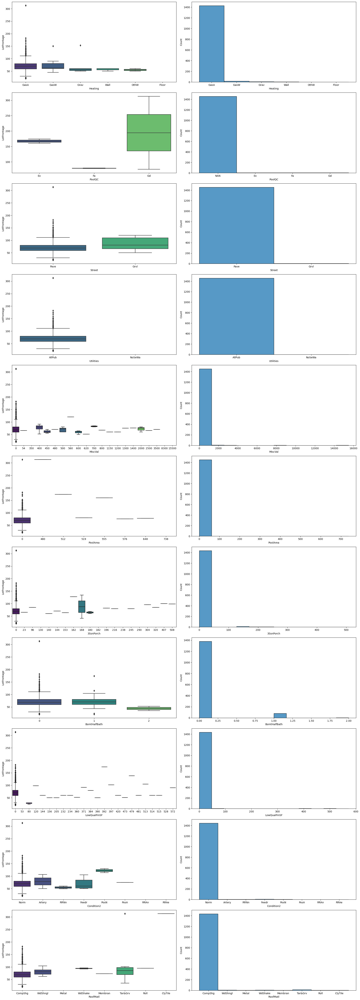

In [127]:
useless_col=['Heating','PoolQC','Street','Utilities','MiscVal','PoolArea','3SsnPorch','BsmtHalfBath','LowQualFinSF','Condition2','RoofMatl']

plt.figure(figsize=(20, cat_col.shape[1]*5))
for i, col in enumerate(useless_col):
    plt.subplot(cat_col.shape[1], 2, 2*i+1)
    sns.boxplot(data=df_train, x=col, y='LotFrontage', palette='viridis')
    plt.subplot(cat_col.shape[1], 2, 2*i+2)
    sns.histplot(df_train[col].fillna('NAN'))
plt.tight_layout()
plt.show()